<a href="https://colab.research.google.com/github/AjinJayan/AJ/blob/master/OBject_isolation_opencv.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [44]:
import cv2
import numpy as np 
from google.colab.patches import cv2_imshow

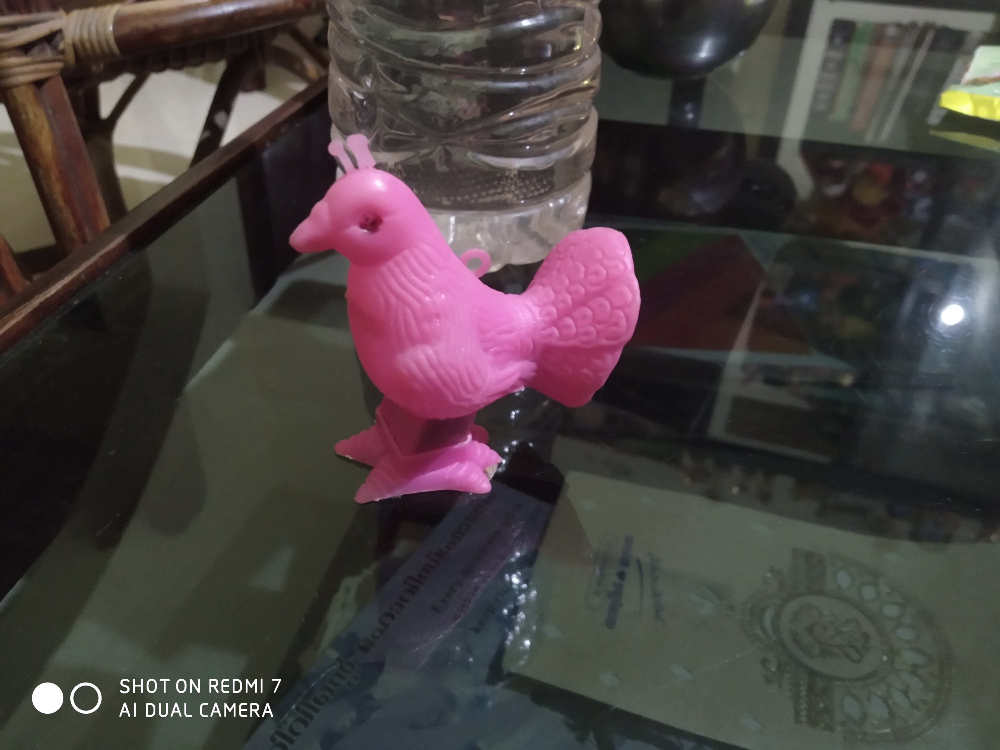

In [45]:
crown = cv2.imread("/content/IMG_20210202_230048.jpg")
cv2_imshow(crown)

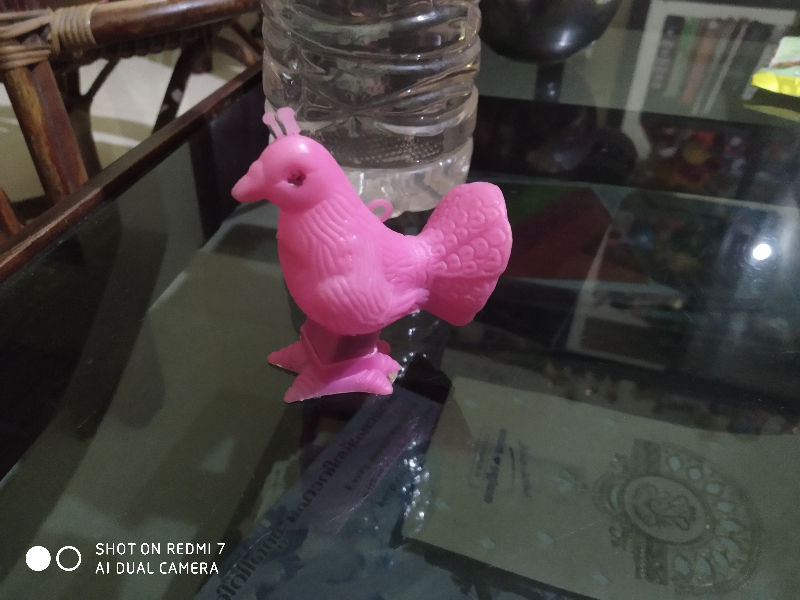

In [46]:
crown = cv2.resize(crown,None,fx=0.2,fy=0.2,interpolation= cv2.INTER_CUBIC)
cv2_imshow(crown)

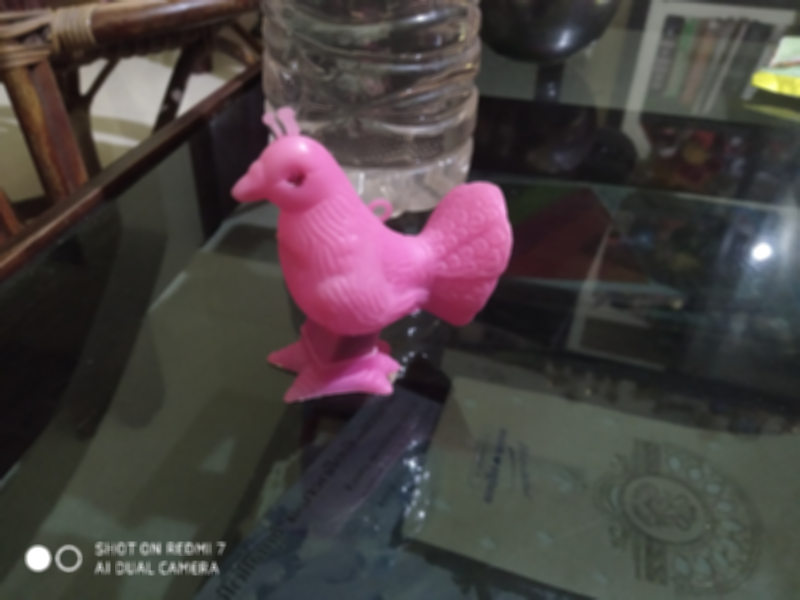

In [47]:
gauss = cv2.GaussianBlur(crown,(5,5),9)
cv2_imshow(gauss)

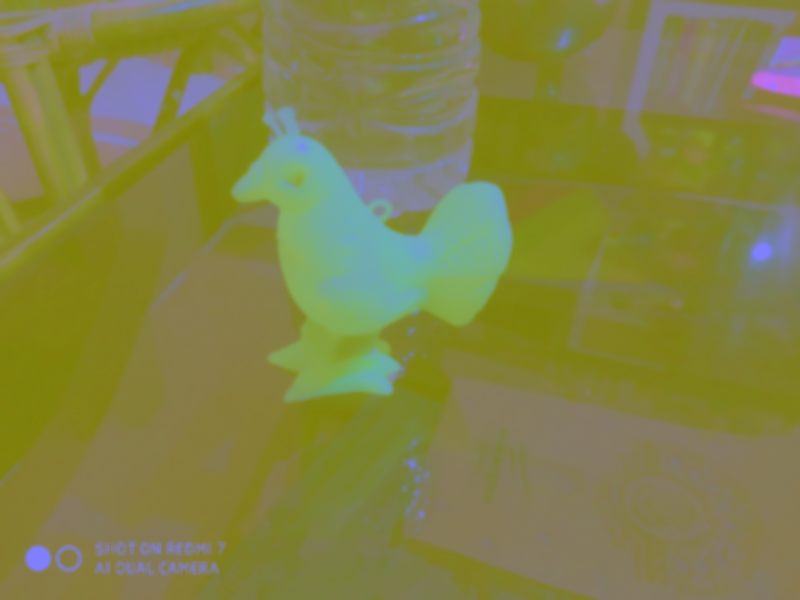

In [48]:
lab = cv2.cvtColor(gauss,cv2.COLOR_BGR2Lab)
cv2_imshow(lab)

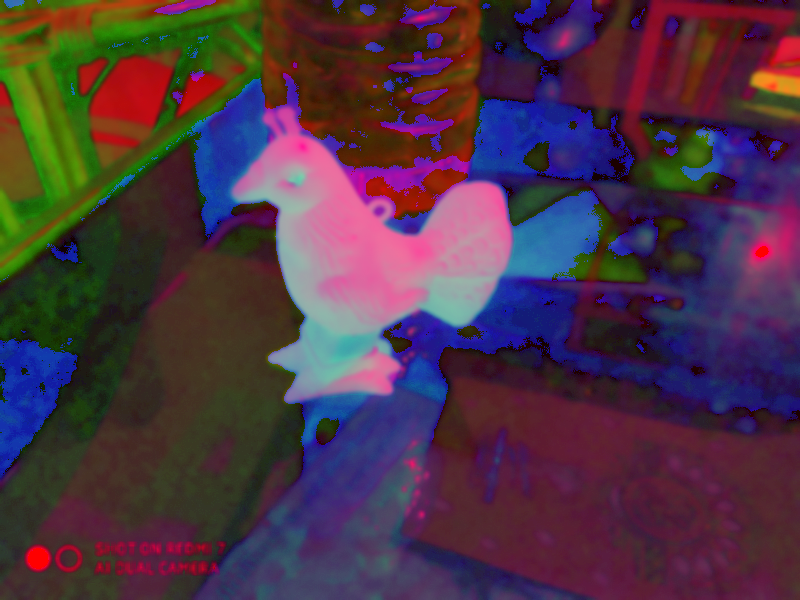

In [49]:
hsv = cv2.cvtColor(gauss,cv2.COLOR_BGR2HSV)
cv2_imshow(hsv)

In [50]:
l_low = 0
a_low = 0
b_low = 0

""" Upper Color Limit """
l_up  = 220
a_up  = 145
b_up  = 255

lower = [l_low,a_low,b_low]
upper = [l_up,a_up,b_up]

lower=np.array(lower,dtype=np.uint8)
upper=np.array(upper,dtype=np.uint8)

print(lower)
print(upper)

[0 0 0]
[220 145 255]


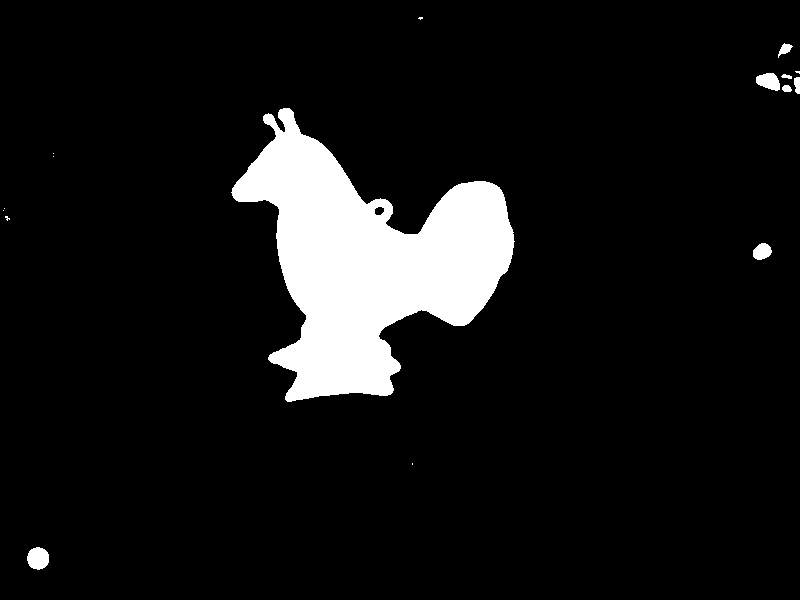

In [51]:
crown_rough =255 - cv2.inRange(lab,lower,upper)
cv2_imshow(crown_rough)

In [52]:
contours, hierarchy = cv2.findContours(crown_rough,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)
len(contours)

17

In [53]:
crown_contour = max(contours,key= cv2.contourArea)

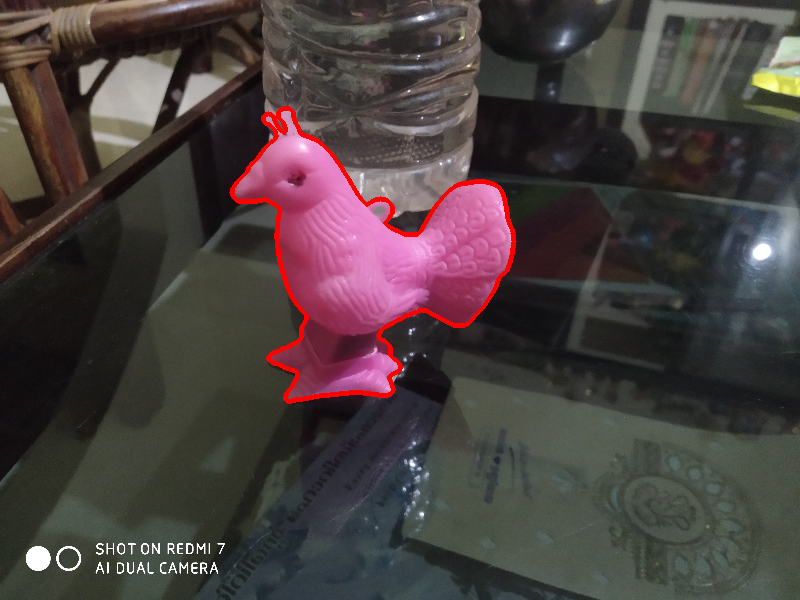

In [54]:
image1 = crown.copy()
cv2.drawContours(image1,[crown_contour],0,(0,0,255),3)
cv2_imshow(image1)

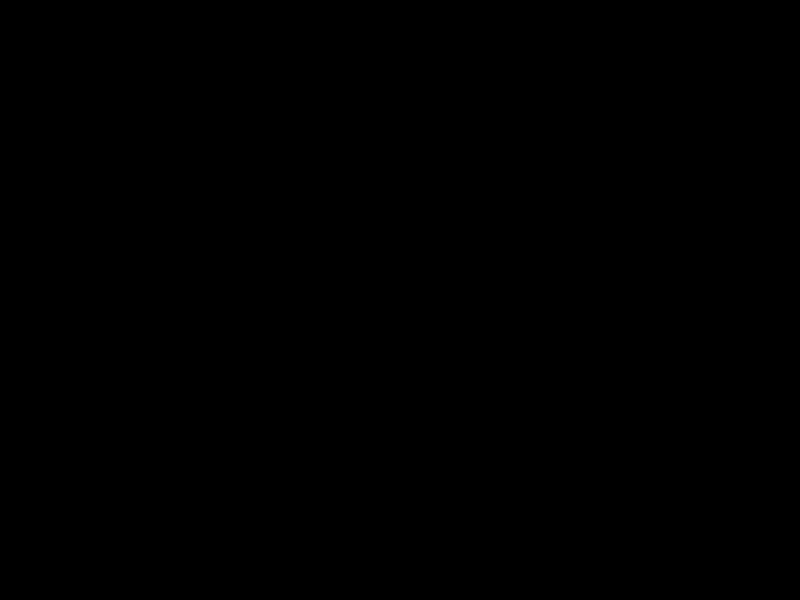

In [55]:
mask = np.zeros(crown.shape,dtype=crown.dtype)
cv2_imshow(mask)

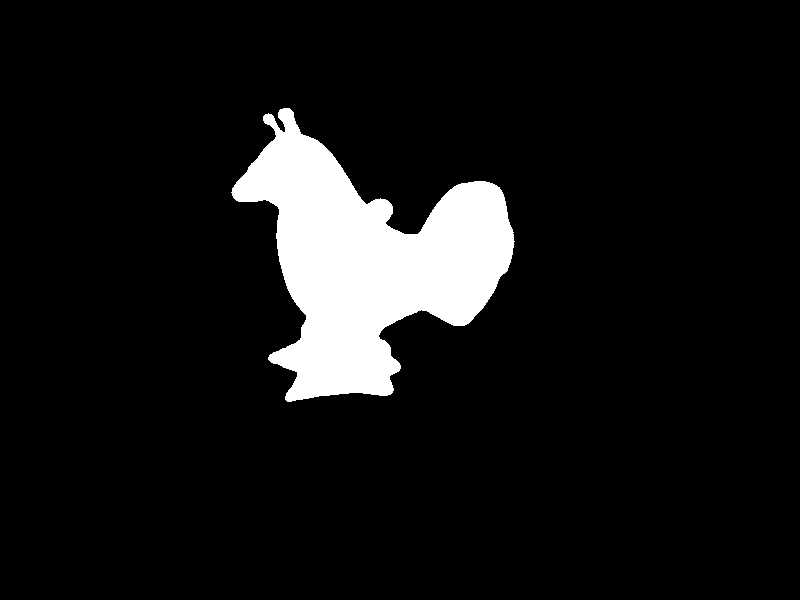

In [56]:
cv2.drawContours(mask,[crown_contour],0,(255,255,255),-1)
cv2_imshow(mask)

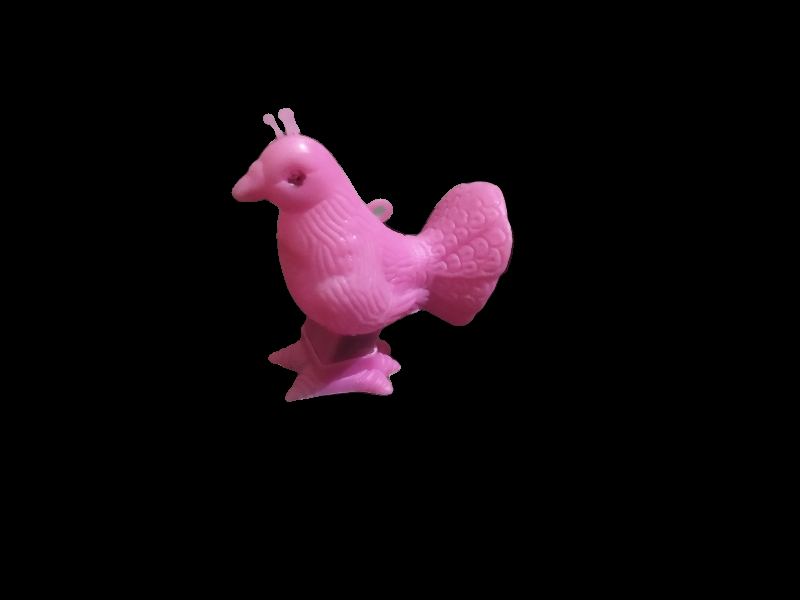

In [57]:
crown_iso = cv2.bitwise_and(crown,mask)
cv2_imshow(crown_iso)

In [58]:
M = cv2.moments(crown_contour)

In [59]:
Area = M['m00']
int(Area)

39476

In [60]:
m10 = int(M['m10'])
m01 = int(M['m01'])
(m10,m01)

(14514061, 10339973)

In [61]:
Cx = int(m10/Area)
Cy = int(m01/Area)
(Cx,Cy)

(367, 261)

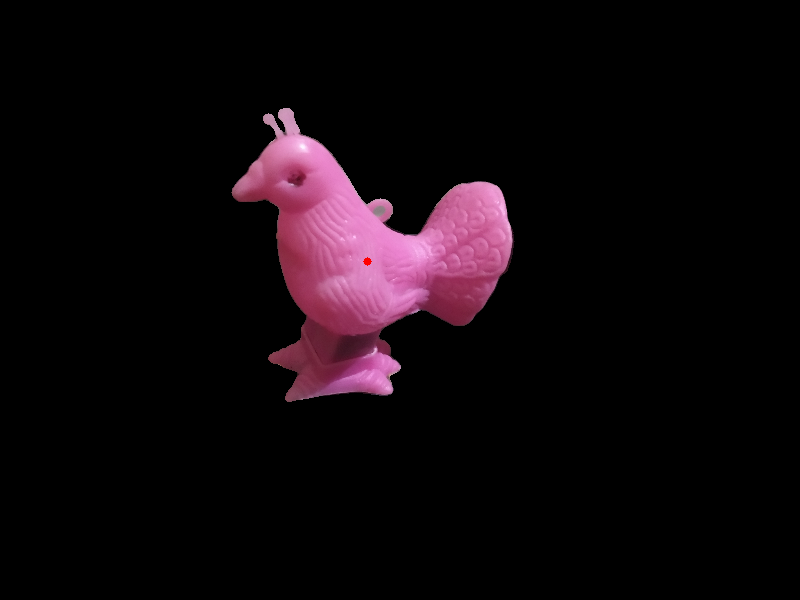

In [62]:
cv2.circle(crown_iso,(Cx,Cy),4,(0,0,255),-1)
cv2_imshow(crown_iso)

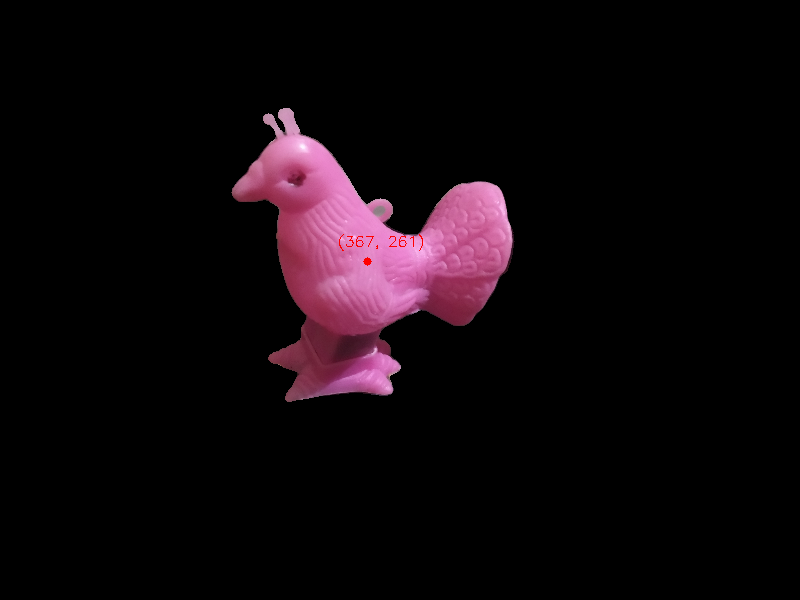

In [63]:
font = cv2.FONT_HERSHEY_SIMPLEX
cv2.putText(crown_iso,f'{Cx,Cy}'.format(),(Cx-30,Cy-15), font, 0.5, (0,0,255), 1)
cv2_imshow(crown_iso)